# Custom Training with YOLOv5 on NIST Buckets Dataset

* In this project, a custom YOLOv5 model is trained on a dataset collected using the tracking camera sensor from VOXL m500 drone ([tracking sensor specs](https://docs.modalai.com/M0014/)).

* The dataset has been collected indoors with different lighting. It consists of 1500+ images that cover 8 different bucket classes:

```
["bucket-1", "bucket-1a", "bucket-2", "bucket-2a",
 "bucket-3", "bucket-3a", "bucket-4", "bucket-4a"]
```
*
The Train/Validataion/Test split is as follows:
  1. Training Set : 1.2k images
  2. Validation Set: 215 images
  3. Test Set: 72 images

* Roboflow has been used to label these images and export them in the proper format to be used by the corresponding model of interest, in this case; YOLOv5.

* Dataset could be downloaded/exported from the following link [nist-buckets-dataset](https://universe.roboflow.com/nist-autonomous-inspection/nist-automation-buckets-detection/dataset/1)


* After training is done, the best pretrained weights (best.pt) are downloaded to be tested locally using the offboard ros yolov5 ros node.



# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and ROBOFLOW and install requirements
!git clone https://github.com/ultralytics/yolov5  # clone yolov5 repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

# To use the free GPU by google colab
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15973, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (82/82), done.
remote: Total 15973 (delta 84), reused 97 (delta 60), pack-reused 15831
Receiving objects: 100% (15973/15973), 14.63 MiB | 14.67 MiB/s, done.
Resolving deltas: 100% (10957/10957), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.6/599.6 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00
Setup complete. Using torch 2.0

# Step 2: Import Dataset from Roboflow


In [ ]:
from roboflow import Roboflow

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="LPtdUguVf1vjSDZJdbRA")
project = rf.workspace("nist-autonomous-inspection").project("nist-automation-buckets-detection")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/NIST-Automation-Buckets-Detection-1 in yolov5pytorch:: 100%|██████████| 3034/3034 [00:00<00:00, 3650.29it/s]


# Step 3: Train Custom YOLOv5 model

Options for training are as follows:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Here we used only 100 epochs!)
- **data:** dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the yolov5s pretrained checkpoint, which is the second smallest and fastest model from yolov5.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/NIST-Automation-Buckets-Detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 7404), started 0:16:08 ago. (Use '!kill 7404' to kill it.)

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/NIST-Automation-Buckets-Detection-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/72 /content/datasets/NIST-Automation-Buckets-Detection-1/test/images/frame-000032_png.rf.74189761409dc932e9b0a439819f09bb.jpg: 416x416 1 bucket-3, 1 bucket-3a, 8.1ms
image 2/72 /content/datasets/NIST-Automation-Buckets-Detection-1/test/images/frame-000148_png.rf.3cc1647c2bcf5360530086409d239c

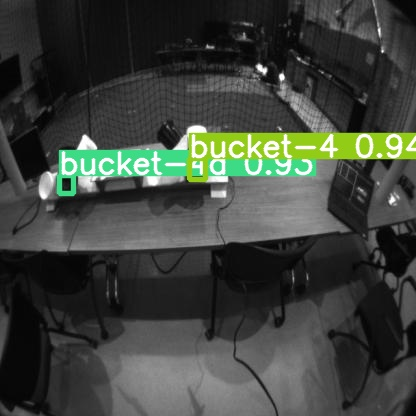

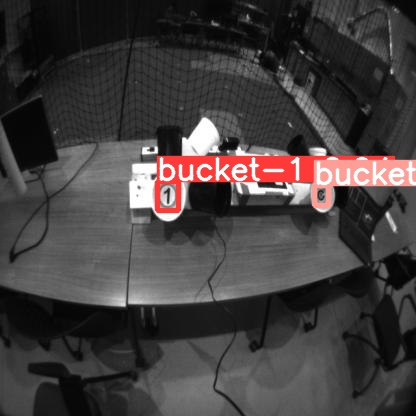

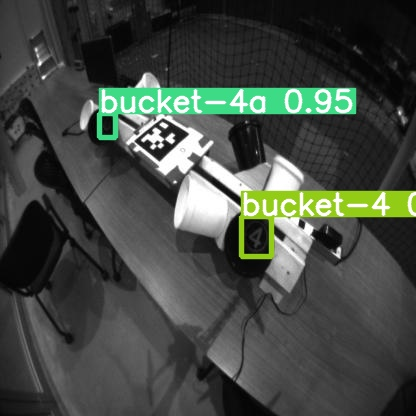

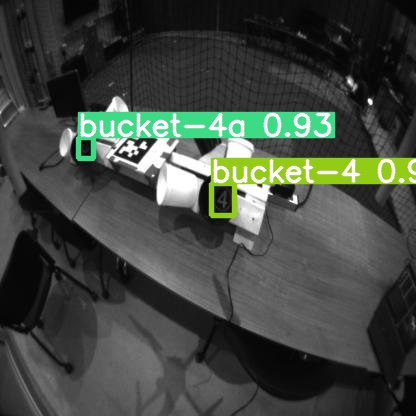

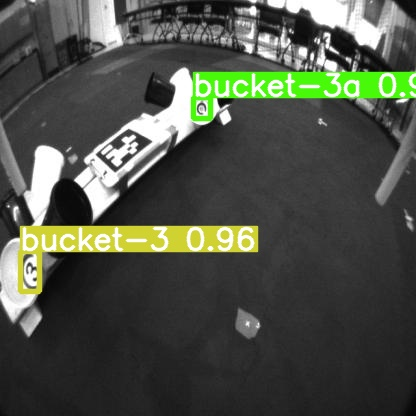

...

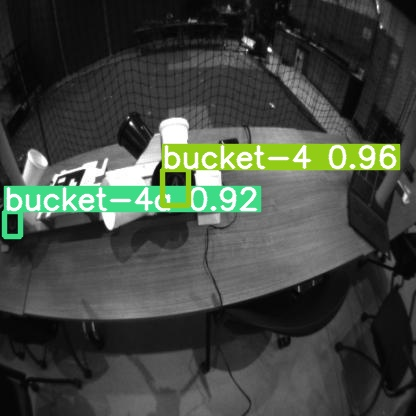

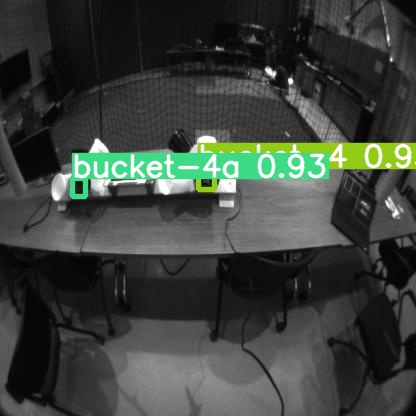

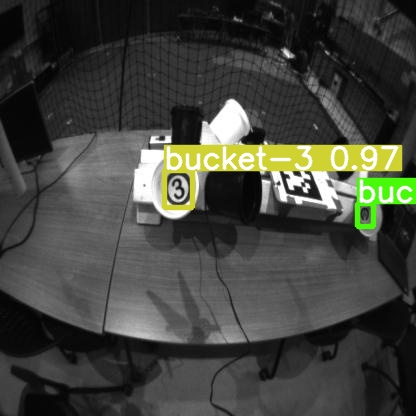

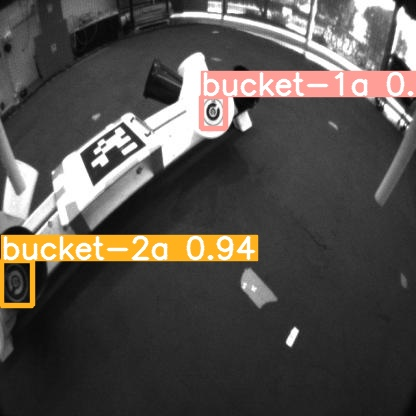

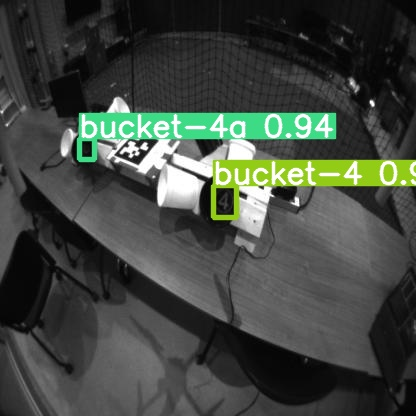

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Download best weights in pytorch format and future exports in different model formats:

The best pretrained weights are then download to be used in a yolov5 ROS wrapper to run in real-time while the drone is inspecting the buckets.

In [ ]:
#export model's weights for future use in offboard applications
from google.colab import files
files.download('./runs/train/exp/weights/best.pt') # change the exp number if you ran multiple training sessions

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Convert the best weights we have to .pb model to be then converted to .tflite
# with the correct parameters using modalai structure

!python export.py --weights runs/train/exp/weights/best.pt --include pb --img 416 --data {dataset.location}/data.yaml

export: data=/content/datasets/NIST-Automation-Buckets-Detection-1/data.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['pb']
YOLOv5 🚀 v7.0-181-g3812a1a Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 10647, 13) (13.7 MB)

TensorFlow SavedModel: starting export with tensorflow 2.12.0...

                 from  n    params  module                                  arguments                     
2023-06-16 22:15:46.775250: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device

In [ ]:
# Convert the best weights we have to fp16 Tflite model to be deployed on voxl
# change the exp number if you ran multiple training sessions
!python export.py --weights runs/train/exp/weights/best.pt --include tflite --img 416 --data {dataset.location}/data.yaml

export: data=/content/datasets/NIST-Automation-Buckets-Detection-1/data.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[320], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v7.0-181-g3812a1a Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 6300, 13) (13.7 MB)

TensorFlow SavedModel: starting export with tensorflow 2.12.0...

                 from  n    params  module                                  arguments                     
2023-06-16 21:48:30.735826: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable dev

In [ ]:
# Check the input and output layer names for model conversion

import tensorflow as tf
from tensorflow.python.platform import gfile

# Load the PB model.
with tf.io.gfile.GFile('runs/train/exp/weights/best.pb', 'rb') as f:
    graph_def = tf.compat.v1.GraphDef()
    graph_def.ParseFromString(f.read())

# Print all the tensor names.
for node in graph_def.node:
    print(node.name)


x
model/tfc3_5/tf_conv_42/beta
model/tfc3_5/sequential_10/tf_bottleneck_8/tf_conv_44/beta
model/tfc3_5/sequential_10/tf_bottleneck_8/tf_conv_43/beta
model/tfc3_5/tf_conv_40/beta
model/tf_conv_39/beta
model/tfc3_4/tf_conv_36/beta
model/tfc3_4/sequential_9/tf_bottleneck_7/tf_conv_38/beta
model/tfc3_4/sequential_9/tf_bottleneck_7/tf_conv_37/beta
model/tfc3_4/tf_conv_34/beta
model/tf_conv_33/beta
model/tfsppf/tf_conv_32/beta
model/tfsppf/tf_conv_31/beta
model/tfc3_3/tf_conv_28/beta
model/tfc3_3/sequential_8/tf_bottleneck_6/tf_conv_30/beta
model/tfc3_3/sequential_8/tf_bottleneck_6/tf_conv_29/beta
model/tfc3_3/tf_conv_26/beta
model/tf_conv_25/beta
model/tfc3_2/tf_conv_18/beta
model/tfc3_2/sequential_6/tf_bottleneck_5/tf_conv_24/beta
model/tfc3_2/sequential_6/tf_bottleneck_5/tf_conv_23/beta
model/tfc3_2/sequential_6/tf_bottleneck_4/tf_conv_22/beta
model/tfc3_2/sequential_6/tf_bottleneck_4/tf_conv_21/beta
model/tfc3_2/sequential_6/tf_bottleneck_3/tf_conv_20/beta
model/tfc3_2/sequential_6/tf_bo